In [1]:
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False


2022-02-14 13:37:19.055254: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-02-14 13:37:19.055272: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
df = pd.read_csv('./data/ouput.csv')

In [3]:
df["tstp"] = pd.to_datetime(df["tstp"])

In [4]:
df["energy(kWh/hh)"] = pd.to_numeric(df["energy(kWh/hh)"], downcast="float", errors="coerce")

In [5]:
df.loc[0,"tstp"].year

2011

In [6]:
df.describe(datetime_is_numeric=True).transpose()


,count,mean,min,25%,50%,75%,max,std
tstp,396562,2013-01-10 20:36:04.252752640,2011-11-23 10:00:00,2012-06-18 06:30:00,2013-01-10 21:15:00,2013-08-05 10:52:30,2014-02-28 00:00:00,NaN
energy(kWh/hh),396552.0,0.217255,0.0,0.068,0.118,0.251,4.595,0.301549


In [7]:
#df["tstp"] = df["tstp"].map(pd.Timestamp.timestamp)


In [8]:
#day = 24*60*60
#year = (365.2425)*day

#df['Day sin'] = np.sin(df["tstp"] * (2 * np.pi / day))
#df['Day cos'] = np.cos(df["tstp"]* (2 * np.pi / day))
#df['Year sin'] = np.sin(df["tstp"] * (2 * np.pi / year))
#df['Year cos'] = np.cos(df["tstp"] * (2 * np.pi / year))


In [9]:
hh_filt = df["LCLid"] == "MAC000150"
hh_df = df[hh_filt]

In [10]:
hh_df.pop("LCLid")
timestamps = hh_df.pop("tstp")

In [11]:
hh_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
energy(kWh/hh),39719.0,0.203399,0.232033,0.04,0.086,0.128,0.203,2.631


In [12]:
column_indices = {name: i for i, name in enumerate(df.columns)}

n = len(hh_df)
train_df = hh_df[0:int(n*0.7)]
val_df = hh_df[int(n*0.7):int(n*0.9)]
test_df = hh_df[int(n*0.9):]

num_features = hh_df.shape[1]


In [13]:
train_mean = train_df.mean()
train_std = train_df.std()
train_max = train_df.max()

train_df = (train_df) / train_max
val_df = (val_df) / train_max
test_df = (test_df) / train_max

In [14]:
train_df

,energy(kWh/hh)
356842,0.114405
356843,0.048271
356844,0.076397
356845,0.214367
356846,0.060433
...,...
384641,0.025846
384642,0.032307
384643,0.022045
384644,0.025466


In [15]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  @property
  def train(self):
      return self.make_dataset(self.train_df)

  @property
  def val(self):
      return self.make_dataset(self.val_df)

  @property
  def test(self):
      return self.make_dataset(self.test_df)
  
  @property
  def example(self):
      """Get and cache an example batch of `inputs, labels` for plotting."""
      result = getattr(self, '_example', None)
      if result is None:
        # No example batch was found, so get one from the `.train` dataset
        result = next(iter(self.train))
        # And cache it for next time
        self._example = result
      return result


  def split_window(self, features):
      inputs = features[:, self.input_slice, :]
      labels = features[:, self.labels_slice, :]
      if self.label_columns is not None:
        labels = tf.stack(
            [labels[:, :, self.column_indices[name]] for name in self.label_columns],
            axis=-1)

      # Slicing doesn't preserve static shape information, so set the shapes
      # manually. This way the `tf.data.Datasets` are easier to inspect.
      inputs.set_shape([None, self.input_width, None])
      labels.set_shape([None, self.label_width, None])

      return inputs, labels

  def make_dataset(self, data):
      data = np.array(data, dtype=np.float32)
      ds = tf.keras.utils.timeseries_dataset_from_array(
          data=data,
          targets=None,
          sequence_length=self.total_window_size,
          sequence_stride=1,
          shuffle=True,
          batch_size=32,)

      ds = ds.map(self.split_window)

      return ds
    
  def plot(self, model=None, plot_col='energy(kWh/hh)', max_subplots=3):
      inputs, labels = self.example
      plt.figure(figsize=(12, 8))
      plot_col_index = self.column_indices[plot_col]
      max_n = min(max_subplots, len(inputs))
      for n in range(max_n):
        plt.subplot(max_n, 1, n+1)
        plt.ylabel(f'{plot_col} [normed]')
        plt.plot(self.input_indices, inputs[n, :, plot_col_index],
                 label='Inputs', marker='.', zorder=-10)

        if self.label_columns:
          label_col_index = self.label_columns_indices.get(plot_col, None)
        else:
          label_col_index = plot_col_index

        if label_col_index is None:
          continue

        plt.scatter(self.label_indices, labels[n, :, label_col_index],
                    edgecolors='k', label='Labels', c='#2ca02c', s=64)
        if model is not None:
          predictions = model(inputs)
          plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                      marker='X', edgecolors='k', label='Predictions',
                      c='#ff7f0e', s=64)

        if n == 0:
          plt.legend()

        plt.xlabel('Time [hh]')


    
  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])


In [16]:

w2 = WindowGenerator(input_width=6, label_width=1, shift=1,
                     label_columns=['energy(kWh/hh)'])
w2

Total window size: 7
Input indices: [0 1 2 3 4 5]
Label indices: [6]
Label column name(s): ['energy(kWh/hh)']

In [17]:
single_step_window = WindowGenerator(
    input_width=1, label_width=1, shift=1,
    label_columns=['energy(kWh/hh)'], train_df=train_df, val_df=val_df, test_df=test_df)
single_step_window

Total window size: 2
Input indices: [0]
Label indices: [1]
Label column name(s): ['energy(kWh/hh)']

In [21]:
for element in single_step_window.train:
  print(element)


(<tf.Tensor: shape=(32, 1, 1), dtype=float32, numpy=
array([[[0.03420753]],

       [[0.05359179]],

       [[0.07145572]],

       [[0.06461421]],

       [[0.03230711]],

       [[0.08931965]],

       [[0.11744583]],

       [[0.03344736]],

       [[0.03116686]],

       [[0.05245154]],

       [[0.07563664]],

       [[0.0254656 ]],

       [[0.03268719]],

       [[0.02356518]],

       [[0.0858989 ]],

       [[0.07221588]],

       [[0.04522995]],

       [[0.03686811]],

       [[0.02888635]],

       [[0.1041429 ]],

       [[0.05131129]],

       [[0.03686811]],

       [[0.60699356]],

       [[0.0627138 ]],

       [[0.05701254]],

       [[0.10224249]],

       [[0.02888635]],

       [[0.27290004]],

       [[0.05435196]],

       [[0.02926644]],

       [[0.06005321]],

       [[0.0231851 ]]], dtype=float32)>, <tf.Tensor: shape=(32, 1, 1), dtype=float32, numpy=
array([[[0.05587229]],

       [[0.04484987]],

       [[0.05397188]],

       [[0.4481186 ]],

       [[0.022

(<tf.Tensor: shape=(32, 1, 1), dtype=float32, numpy=
array([[[0.04751045]],

       [[0.03002661]],

       [[0.03990878]],

       [[0.02470543]],

       [[0.05283162]],

       [[0.03838845]],

       [[0.11098441]],

       [[0.03420753]],

       [[0.09198023]],

       [[0.04332953]],

       [[0.03762828]],

       [[0.01938426]],

       [[0.03496769]],

       [[0.03572786]],

       [[0.04751045]],

       [[0.02356518]],

       [[0.16381603]],

       [[0.02850627]],

       [[0.0836184 ]],

       [[0.03876853]],

       [[0.03914861]],

       [[0.41657162]],

       [[0.0790574 ]],

       [[0.03116686]],

       [[0.06119346]],

       [[0.04066895]],

       [[0.04522995]],

       [[0.08095781]],

       [[0.05739262]],

       [[0.13492967]],

       [[0.07107564]],

       [[0.05587229]]], dtype=float32)>, <tf.Tensor: shape=(32, 1, 1), dtype=float32, numpy=
array([[[0.06043329]],

       [[0.02584569]],

       [[0.03610794]],

       [[0.03192702]],

       [[0.032

(<tf.Tensor: shape=(32, 1, 1), dtype=float32, numpy=
array([[[0.05929305]],

       [[0.0277461 ]],

       [[0.04484987]],

       [[0.10718358]],

       [[0.06385405]],

       [[0.12694792]],

       [[0.07145572]],

       [[0.06575447]],

       [[0.03078677]],

       [[0.3481566 ]],

       [[0.03914861]],

       [[0.06461421]],

       [[0.04751045]],

       [[0.03230711]],

       [[0.02888635]],

       [[0.1254276 ]],

       [[0.04713037]],

       [[0.14253135]],

       [[0.03572786]],

       [[0.1041429 ]],

       [[0.05169138]],

       [[0.03990878]],

       [[0.04066895]],

       [[0.10338275]],

       [[0.05701254]],

       [[0.02964652]],

       [[0.05625238]],

       [[0.05359179]],

       [[0.04675028]],

       [[0.02660585]],

       [[0.06347396]],

       [[0.05625238]]], dtype=float32)>, <tf.Tensor: shape=(32, 1, 1), dtype=float32, numpy=
array([[[0.0649943 ]],

       [[0.03724819]],

       [[0.05055112]],

       [[0.05625238]],

       [[0.072

(<tf.Tensor: shape=(32, 1, 1), dtype=float32, numpy=
array([[[0.13568984]],

       [[0.0254656 ]],

       [[0.3432155 ]],

       [[0.16609654]],

       [[0.53439754]],

       [[0.02964652]],

       [[0.03268719]],

       [[0.03838845]],

       [[0.06081337]],

       [[0.0741163 ]],

       [[0.0790574 ]],

       [[0.0486507 ]],

       [[0.22805017]],

       [[0.03078677]],

       [[0.03192702]],

       [[0.05055112]],

       [[0.11136451]],

       [[0.05625238]],

       [[0.02470543]],

       [[0.03724819]],

       [[0.02888635]],

       [[0.0486507 ]],

       [[0.04370962]],

       [[0.12922843]],

       [[0.05321171]],

       [[0.06195363]],

       [[0.06575447]],

       [[0.08893956]],

       [[0.04066895]],

       [[0.02736602]],

       [[0.109084  ]],

       [[0.0231851 ]]], dtype=float32)>, <tf.Tensor: shape=(32, 1, 1), dtype=float32, numpy=
array([[[0.08551881]],

       [[0.02926644]],

       [[0.21968833]],

       [[0.1254276 ]],

       [[0.478

In [22]:
class Baseline(tf.keras.Model):
  def __init__(self, label_index=None):
    super().__init__()
    self.label_index = label_index

  def call(self, inputs):
    if self.label_index is None:
      return inputs
    result = inputs[:, :, self.label_index]
    return result[:, :, tf.newaxis]


In [25]:
baseline = Baseline(label_index=column_indices['energy(kWh/hh)'])

baseline.compile(loss=tf.losses.MeanSquaredError(),
                 metrics=[tf.metrics.MeanAbsoluteError()])

val_performance = {}
performance = {}
val_performance['Baseline'] = baseline.evaluate(wide_window.val)
performance['Baseline'] = baseline.evaluate(wide_window.test, verbose=0)



ValueError: in user code:

    File "/home/daniel/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1525, in test_function  *
        return step_function(self, iterator)
    File "/home/daniel/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1514, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/daniel/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1507, in run_step  **
        outputs = model.test_step(data)
    File "/home/daniel/.local/lib/python3.8/site-packages/keras/engine/training.py", line 1471, in test_step
        y_pred = self(x, training=False)
    File "/home/daniel/.local/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 67, in error_handler
        raise e.with_traceback(filtered_tb) from None

    ValueError: Exception encountered when calling layer "baseline_2" (type Baseline).
    
    in user code:
    
        File "/tmp/ipykernel_30010/2923165435.py", line 9, in call  *
            result = inputs[:, :, self.label_index]
    
        ValueError: slice index 2 of dimension 2 out of bounds. for '{{node baseline_2/strided_slice}} = StridedSlice[Index=DT_INT32, T=DT_FLOAT, begin_mask=3, ellipsis_mask=0, end_mask=3, new_axis_mask=0, shrink_axis_mask=4](IteratorGetNext, baseline_2/strided_slice/stack, baseline_2/strided_slice/stack_1, baseline_2/strided_slice/stack_2)' with input shapes: [?,24,1], [3], [3], [3] and with computed input tensors: input[1] = <0 0 2>, input[2] = <0 0 3>, input[3] = <1 1 1>.
    
    
    Call arguments received:
      • inputs=tf.Tensor(shape=(None, 24, 1), dtype=float32)


In [26]:
wide_window = WindowGenerator(
    input_width=24, label_width=24, shift=1,
    label_columns=['energy(kWh/hh)'], train_df=train_df, val_df=val_df, test_df=test_df)

wide_window

Total window size: 25
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]
Label column name(s): ['energy(kWh/hh)']

In [27]:
for element in wide_window.train:
  print(element)

(<tf.Tensor: shape=(32, 24, 1), dtype=float32, numpy=
array([[[0.03306727],
        [0.0254656 ],
        [0.03344736],
        [0.0277461 ],
        [0.03534778],
        [0.02584569],
        [0.03268719],
        [0.02850627],
        [0.02736602],
        [0.03724819],
        [0.15697452],
        [0.09007981],
        [0.0836184 ],
        [0.07867731],
        [0.09122007],
        [0.08437856],
        [0.06423413],
        [0.08399848],
        [0.05701254],
        [0.20600532],
        [0.31660965],
        [0.13530977],
        [0.12200684],
        [0.12390726]],

       [[0.08057772],
        [0.04599012],
        [0.04218928],
        [0.02356518],
        [0.03306727],
        [0.03420753],
        [0.0231851 ],
        [0.03420753],
        [0.03116686],
        [0.02204485],
        [0.03534778],
        [0.0254656 ],
        [0.03420753],
        [0.02698594],
        [0.03192702],
        [0.02660585],
        [0.20448498],
        [0.2668187 ],
        [0.10680349]

(<tf.Tensor: shape=(32, 24, 1), dtype=float32, numpy=
array([[[0.15621437],
        [0.1436716 ],
        [0.04294945],
        [0.04941087],
        [0.06917521],
        [0.10300266],
        [0.07069556],
        [0.05967313],
        [0.06157355],
        [0.05929305],
        [0.0836184 ],
        [0.0395287 ],
        [0.03610794],
        [0.04142911],
        [0.05625238],
        [0.06309388],
        [0.07601672],
        [0.06309388],
        [0.06461421],
        [0.02394527],
        [0.03458761],
        [0.02584569],
        [0.03078677],
        [0.02432535]],

       [[0.05321171],
        [0.06005321],
        [0.03420753],
        [0.03116686],
        [0.03268719],
        [0.03230711],
        [0.03990878],
        [0.0231851 ],
        [0.03002661],
        [0.03306727],
        [0.02204485],
        [0.03800836],
        [0.02622577],
        [0.03458761],
        [0.02812619],
        [0.03458761],
        [0.02432535],
        [0.03838845],
        [0.02888635]

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(<tf.Tensor: shape=(32, 24, 1), dtype=float32, numpy=
array([[[0.06081337],
        [0.06879513],
        [0.04332953],
        [0.0277461 ],
        [0.02850627],
        [0.03914861],
        [0.02394527],
        [0.02622577],
        [0.03990878],
        [0.03344736],
        [0.05283162],
        [0.06461421],
        [0.04979095],
        [0.04941087],
        [0.03876853],
        [0.02204485],
        [0.02622577],
        [0.03344736],
        [0.09882174],
        [0.05967313],
        [0.04599012],
        [0.06233371],
        [0.16305587],
        [0.08475865]],

       [[0.38768527],
        [0.14025085],
        [0.06195363],
        [0.06917521],
        [0.08057772],
        [0.14215128],
        [0.12162675],
        [0.07449639],
        [0.08323831],
        [0.07335614],
        [0.06993538],
        [0.07107564],
        [0.06347396],
        [0.07259597],
        [0.0672748 ],
        [0.06537438],
        [0.06385405],
        [0.03762828],
        [0.03230711]

(<tf.Tensor: shape=(32, 24, 1), dtype=float32, numpy=
array([[[0.02812619],
        [0.01976435],
        [0.02508552],
        [0.02622577],
        [0.02280502],
        [0.02052451],
        [0.03002661],
        [0.0209046 ],
        [0.0231851 ],
        [0.03230711],
        [0.02014443],
        [0.02014443],
        [0.03116686],
        [0.08057772],
        [0.03762828],
        [0.32611173],
        [0.19536297],
        [0.09007981],
        [0.08323831],
        [0.07297605],
        [0.08969973],
        [0.2459141 ],
        [0.12580767],
        [0.23793234]],

       [[0.04218928],
        [0.05473204],
        [0.05625238],
        [0.10072215],
        [0.03534778],
        [0.03420753],
        [0.02736602],
        [0.03040669],
        [0.03610794],
        [0.02660585],
        [0.0231851 ],
        [0.03686811],
        [0.02508552],
        [0.02394527],
        [0.03838845],
        [0.0231851 ],
        [0.02660585],
        [0.03686811],
        [0.02394527]

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(<tf.Tensor: shape=(32, 24, 1), dtype=float32, numpy=
array([[[0.02660585],
        [0.02964652],
        [0.01938426],
        [0.05397188],
        [0.02736602],
        [0.03496769],
        [0.03154694],
        [0.03268719],
        [0.02660585],
        [0.03116686],
        [0.03572786],
        [0.02508552],
        [0.0395287 ],
        [0.02888635],
        [0.03230711],
        [0.03306727],
        [0.03382744],
        [0.02698594],
        [0.03382744],
        [0.04028886],
        [0.0395287 ],
        [0.0395287 ],
        [0.03078677],
        [0.03420753]],

       [[0.02622577],
        [0.03420753],
        [0.03116686],
        [0.03268719],
        [0.02736602],
        [0.03800836],
        [0.02622577],
        [0.03800836],
        [0.03192702],
        [0.02812619],
        [0.03572786],
        [0.02964652],
        [0.03116686],
        [0.02926644],
        [0.38122386],
        [0.23185101],
        [0.099962  ],
        [0.06651463],
        [0.07297605]

(<tf.Tensor: shape=(32, 24, 1), dtype=float32, numpy=
array([[[0.04599012],
        [0.04370962],
        [0.03914861],
        [0.05321171],
        [0.03724819],
        [0.03838845],
        [0.0395287 ],
        [0.05207145],
        [0.03800836],
        [0.03306727],
        [0.03990878],
        [0.03154694],
        [0.04142911],
        [0.03154694],
        [0.03458761],
        [0.03496769],
        [0.03230711],
        [0.03686811],
        [0.03306727],
        [0.03572786],
        [0.03268719],
        [0.03762828],
        [0.03116686],
        [0.03648803]],

       [[0.03078677],
        [0.2508552 ],
        [0.14519194],
        [0.16077538],
        [0.18966173],
        [0.12428734],
        [0.10376283],
        [0.23793234],
        [0.08817939],
        [0.09083998],
        [0.26035726],
        [0.07981756],
        [0.06917521],
        [0.07525656],
        [0.0695553 ],
        [0.06005321],
        [0.06613455],
        [0.04332953],
        [0.03534778]

2022-02-14 13:39:29.026271: W tensorflow/core/framework/op_kernel.cc:1745] OP_REQUIRES failed at strided_slice_op.cc:108 : INVALID_ARGUMENT: slice index 2 of dimension 2 out of bounds.


InvalidArgumentError: Exception encountered when calling layer "baseline_2" (type Baseline).

slice index 2 of dimension 2 out of bounds. [Op:StridedSlice] name: baseline_2/strided_slice/

Call arguments received:
  • inputs=tf.Tensor(shape=(32, 24, 1), dtype=float32)

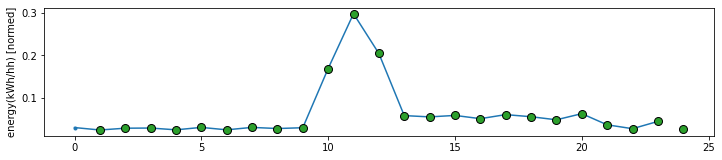

In [28]:
wide_window.plot(baseline)


In [29]:
linear = tf.keras.Sequential([
    tf.keras.layers.Dense(units=1)
])


In [30]:
MAX_EPOCHS = 20

def compile_and_fit(model, window, patience=2):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')

  model.compile(loss=tf.losses.MeanSquaredError(),
                optimizer=tf.optimizers.Adam(),
                metrics=[tf.metrics.MeanAbsoluteError()])

  history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

In [31]:
history = compile_and_fit(linear, single_step_window)

val_performance['Linear'] = linear.evaluate(wide_window.val)
performance['Linear'] = linear.evaluate(wide_window.test, verbose=0)


Epoch 1/20
869/869 [==============================] - 1s 854us/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 2/20
248/248 [==============================] - 0s 887us/step - loss: nan - mean_absolute_error: nan


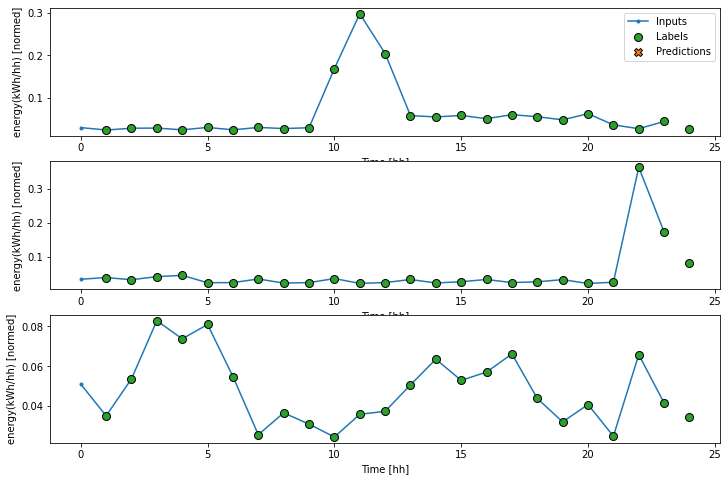

In [32]:
wide_window.plot(linear)


In [33]:
dense = tf.keras.Sequential([
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=1)
])

history = compile_and_fit(dense, single_step_window)

val_performance['Dense'] = dense.evaluate(single_step_window.val)
performance['Dense'] = dense.evaluate(single_step_window.test, verbose=0)


Epoch 1/20
869/869 [==============================] - 1s 1ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 2/20
249/249 [==============================] - 0s 618us/step - loss: nan - mean_absolute_error: nan
